In [ ]:
cd /home/dmoi/projects/foldtree2/

/home/dmoi/projects/foldtree2


In [5]:
import sys
sys.path.append('/home/dmoi/projects/foldtree2')
#read the afdb clusters file
import pandas as pd
import numpy as np
import glob
import os
#autoreload
import pickle
from src import AFDB_tools
import toytree
import tqdm
from matplotlib import pyplot as plt
import torch
from src import pdbgraph
converter = pdbgraph.PDB2PyG( aapropcsv = 'config/aaindex1.csv',)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')


In [6]:
modelname = 'newtrain'
modeldir = './models/'

with open( modeldir + modelname + '.pkl', 'rb') as f:
	encoder, decoder = pickle.load(f)

encoder.eval()
decoder.eval()	
encoder.to(device)
decoder.to(device)

HeteroGAE_Decoder(
  (convs): ModuleList(
    (0-4): 5 x HeteroConv(num_relations=3)
  )
  (norms): ModuleList(
    (0-4): 5 x GraphNorm(200)
  )
  (bn): BatchNorm1d(20, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (norm_in): LayerNorm((20,), eps=1e-05, elementwise_affine=True)
  (bn_foldx): BatchNorm1d(23, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (norm_foldx): LayerNorm((23,), eps=1e-05, elementwise_affine=True)
  (dropout): Dropout(p=0.005, inplace=False)
  (jk): JumpingKnowledge(cat)
  (sigmoid): Sigmoid()
  (lin): Sequential(
    (0): Dropout(p=0.005, inplace=False)
    (1): DynamicTanh(normalized_shape=1000, alpha_init_value=0.5, channels_last=True)
    (2): Linear(in_features=1000, out_features=200, bias=True)
    (3): GELU(approximate='none')
    (4): Linear(in_features=200, out_features=100, bias=True)
    (5): GELU(approximate='none')
    (6): Linear(in_features=100, out_features=40, bias=True)
    (7): GELU(approximate='none')
   

In [7]:
from torch_geometric.data import DataLoader , HeteroData

struct_dat = pdbgraph.StructureDataset('structalignmk4.h5')
#struct_dat = ft2.StructureDataset('structs_training.h5')
encoder_loader = DataLoader(struct_dat, batch_size=1, shuffle=True)
#encode the structures
encode_alns = True
if encode_alns == True:
	def databatch2list(loader , limit = 10):
		for i,data in enumerate(loader):
			if i > limit:
				break
			data = data.to_data_list()
			for d in data:
				d = d.to(device)
				yield d
	encoder_loader = databatch2list(encoder_loader)
	encoder.encode_structures_fasta(encoder_loader , modeldir + modelname+'_aln_encoded_test.fasta' )

/home/dmoi/miniforge3/envs/pyg/lib/python3.12/site-packages/torch_geometric/deprecation.py:26: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
11it [00:01,  5.58it/s]


In [8]:
encoded_fasta =  modeldir + modelname+'_aln_encoded_test.fasta' 
seqstr = ''
ID = ''
seqdict = {}
with open(encoded_fasta, 'r') as f:
	#read all chars of file into a string
	for line in tqdm.tqdm(f):
		if line[0] == '>' and line[-1] == '\n':
			seqdict[ID] = seqstr
			ID = line[1:].strip()
			seqstr = ''
		else:
			seqstr += line.strip()
del seqdict['']
encoded_df = pd.DataFrame( seqdict.items() , columns=['protid', 'seq'] )
#change index to protid
encoded_df.index = encoded_df.protid
encoded_df = encoded_df.drop( 'protid', axis=1 )

encoded_df['ord'] = encoded_df.seq.map( lambda x: [ ord(c) for c in x] )
#hex starts at 1
encoded_df['hex2'] = encoded_df.ord.map( lambda x: [ hex(c) for c in x] )

166it [00:00, 267893.21it/s]


In [9]:
charset = 249
#make fasta is shifted by 1 and goes from 1-248 included
#0x01 – 0xFF excluding > (0x3E), = (0x3D), < (0x3C), - (0x2D), Space (0x20), Carriage Return (0x0d) and Line Feed (0x0a)
#replace 0x22 or " which is necesary for nexus files and 0x23 or # which is also necesary

replace_dict = {chr(0):chr(246) , '"':chr(248) , '#':chr(247), '>' : chr(249), '=' : chr(250), '<' : chr(251), '-' : chr(252), ' ' : chr(253) , '\r' : chr(254), '\n' : chr(255) }
rev_replace_dict = { v:k for k,v in replace_dict.items() }

replace_dict_ord = { ord(k):ord(v) for k,v in replace_dict.items() }
rev_replace_dict_ord = { ord(v):ord(k) for k,v in replace_dict.items() }

print(replace_dict)
print(rev_replace_dict)

print( replace_dict_ord )

print(rev_replace_dict_ord)

{'\x00': 'ö', '"': 'ø', '#': '÷', '>': 'ù', '=': 'ú', '<': 'û', '-': 'ü', ' ': 'ý', '\r': 'þ', '\n': 'ÿ'}
{'ö': '\x00', 'ø': '"', '÷': '#', 'ù': '>', 'ú': '=', 'û': '<', 'ü': '-', 'ý': ' ', 'þ': '\r', 'ÿ': '\n'}
{0: 246, 34: 248, 35: 247, 62: 249, 61: 250, 60: 251, 45: 252, 32: 253, 13: 254, 10: 255}
{246: 0, 248: 34, 247: 35, 249: 62, 250: 61, 251: 60, 252: 45, 253: 32, 254: 13, 255: 10}


In [10]:
encoded_df.seq = encoded_df.seq.map(lambda x : ''.join([ c if c not in replace_dict else replace_dict[c] for c in x]))
print(encoded_df)

                                                          seq  \
protid                                                          
A0A7K2B1F0  \t$'&$ø÷ø%ý...   
A0A535EYE3  øø!!ýýýýý!ý!!ý!ý!...   
A0A7S2NSI6  %%$%$'%%...   
A0A6N7ZWJ4  øø'('\t'%'\t$\t'\t'...   
A0A3E2NWY2  '\t\t\t\t\t%%...   
A0A0B5I870  ø\t'$$''%'...   
A0A4P6JT05  øø÷!!ý÷...   
M2UF93      øø%%%$$÷ý'$...   
A0A7X6UZY5  øøý'''''\t(\t...   
A0A1D1Z659  øø'ý÷÷%...   

                                                          ord  \
protid                                                          
A0A7K2B1F0  [4, 4, 25, 25, 9, 27, 25, 25, 25, 8, 25, 25, 3...   
A0A535EYE3  [34, 34, 7, 29, 26

In [11]:
import py3Dmol

def view_custom_pdb(pdb_file, chain='A'):
	"""
	Visualize a PDB structure from a file, highlight a specific residue with thicker sticks,
	show the backbone for the selected residue, and add an arrow-like indicator.
	
	Parameters:
	- pdb_file: str, path to the local PDB file.
	- residue_num: int, residue number to highlight.
	- chain: str, the chain identifier (default 'A').
	"""
	# Read the PDB file content
	with open(pdb_file, 'r') as f:
		pdb_content = f.read()

	# Initialize py3Dmol viewer
	viewer = py3Dmol.view(width=800, height=600)
	
	# Add the PDB structure to the viewer
	viewer.addModel(pdb_content, 'pdb')
	
	# Apply cartoon style for the overall structure
	viewer.setStyle({'cartoon': {'color': 'cyan'}})
	
	
	# Add molecular surface for the rest of the structure
	viewer.addSurface(py3Dmol.VDW, {'opacity': 0.5})
	
	
	# Set zoom and background color
	viewer.zoomTo()
	viewer.setBackgroundColor('white')
	
	# Show the structure
	return viewer.show()



A0A7K2B1F0


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

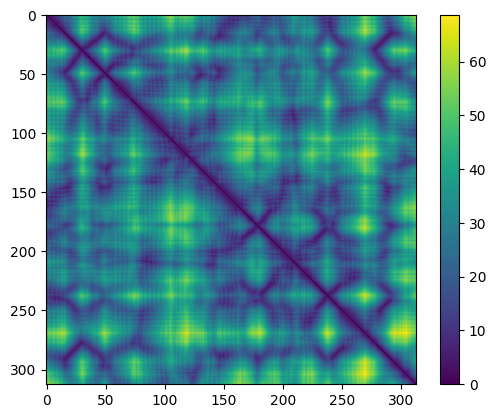

306
torch.Size([306, 20])
HeteroData(
  res={
    x=[306, 20],
    batch=[306],
  },
  positions={ x=[306, 256] },
  godnode={ x=[1, 5] },
  godnode4decoder={ x=[1, 5] },
  (res, backbone, res)={ edge_index=[2, 305] },
  (res, backbone_rev, res)={ edge_index=[2, 305] },
  (godnode4decoder, informs, res)={ edge_index=[2, 306] },
  (res, informs, godnode4decoder)={ edge_index=[2, 306] },
  (res, informs, godnode)={ edge_index=[2, 306] }
)
torch.Size([93636])
tensor([[-1.2079e+01, -1.4657e+01, -1.2787e+01,  ..., -4.9027e+00,
         -7.7841e+00, -8.2547e+00],
        [-1.1566e+01, -1.3917e+01, -1.3097e+01,  ..., -5.3324e+00,
         -8.2394e+00, -7.3904e+00],
        [-1.6724e-03, -1.0595e+01, -1.1836e+01,  ..., -1.0266e+01,
         -1.0066e+01, -1.3574e+01],
        ...,
        [-1.3302e+01, -9.0083e+00, -8.1103e+00,  ..., -1.0975e+01,
         -1.3340e+01, -1.7402e-02],
        [-1.2191e+01, -7.8584e+00, -8.7609e+00,  ..., -8.5812e+00,
         -7.2379e+00, -9.9446e+00],
        [-1

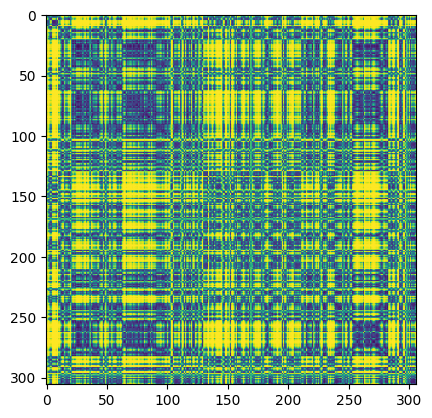

torch.Size([306, 306])
(313, 313)


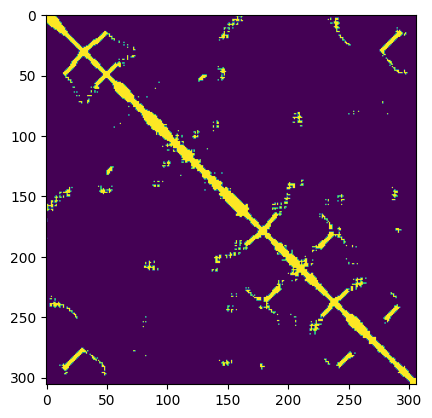

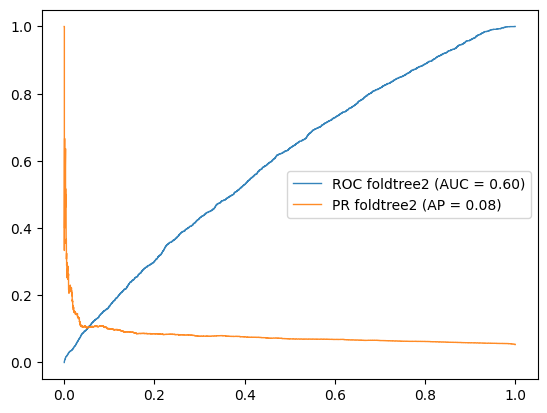

A0A535EYE3


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

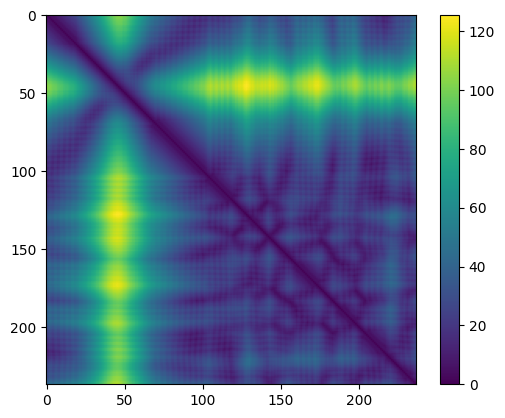

223
torch.Size([223, 20])
HeteroData(
  res={
    x=[223, 20],
    batch=[223],
  },
  positions={ x=[223, 256] },
  godnode={ x=[1, 5] },
  godnode4decoder={ x=[1, 5] },
  (res, backbone, res)={ edge_index=[2, 222] },
  (res, backbone_rev, res)={ edge_index=[2, 222] },
  (godnode4decoder, informs, res)={ edge_index=[2, 223] },
  (res, informs, godnode4decoder)={ edge_index=[2, 223] },
  (res, informs, godnode)={ edge_index=[2, 223] }
)
torch.Size([49729])
tensor([[-1.1762e+01, -1.5029e+01, -1.2891e+01,  ..., -5.5708e+00,
         -8.1796e+00, -8.2390e+00],
        [-1.1233e+01, -1.4868e+01, -1.2237e+01,  ..., -5.6567e+00,
         -7.8206e+00, -7.5521e+00],
        [-1.0522e+01, -4.2739e-02, -4.1074e+00,  ..., -1.3377e+01,
         -1.1461e+01, -1.0775e+01],
        ...,
        [-6.9918e+00, -1.0455e+01, -1.3282e+01,  ..., -8.3335e+00,
         -1.4301e+01, -3.9559e+00],
        [-8.2993e+00, -7.4208e+00, -7.0435e+00,  ..., -1.5350e+01,
         -1.5735e+01, -6.7169e+00],
        [-1

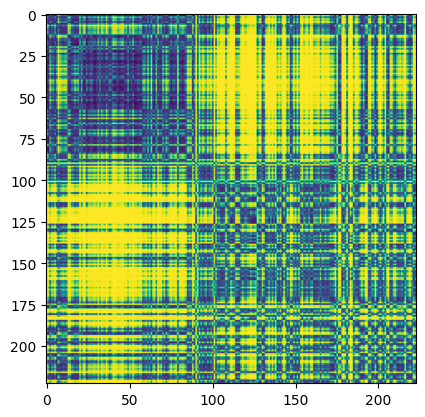

torch.Size([223, 223])
(237, 237)


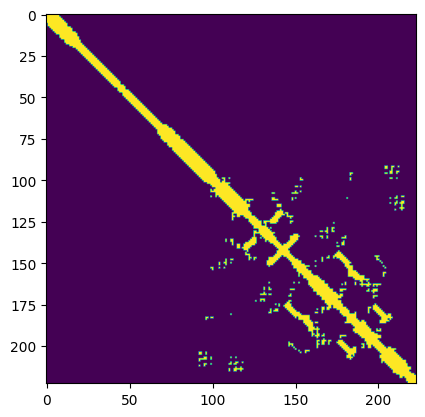

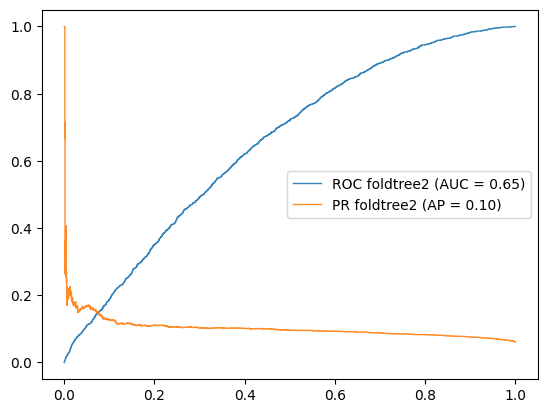

A0A7S2NSI6


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

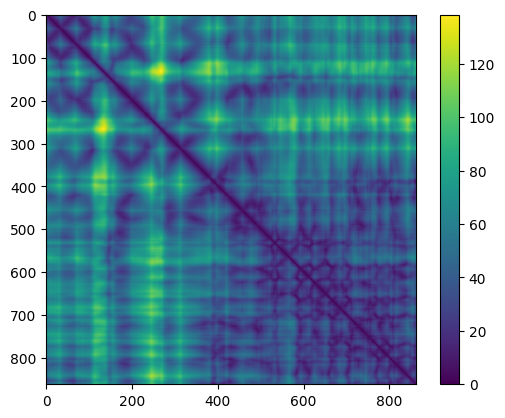

797
torch.Size([797, 20])
HeteroData(
  res={
    x=[797, 20],
    batch=[797],
  },
  positions={ x=[797, 256] },
  godnode={ x=[1, 5] },
  godnode4decoder={ x=[1, 5] },
  (res, backbone, res)={ edge_index=[2, 796] },
  (res, backbone_rev, res)={ edge_index=[2, 796] },
  (godnode4decoder, informs, res)={ edge_index=[2, 797] },
  (res, informs, godnode4decoder)={ edge_index=[2, 797] },
  (res, informs, godnode)={ edge_index=[2, 797] }
)
torch.Size([635209])
tensor([[-11.8299, -14.5074, -11.7329,  ...,  -4.7106,  -7.2662,  -7.7314],
        [-12.0002, -15.3435, -13.0311,  ...,  -5.9448,  -8.4802,  -8.1328],
        [-12.9573,  -9.6480, -10.6252,  ...,  -9.8907,  -8.5964, -10.8779],
        ...,
        [ -9.5532, -14.6217, -11.1008,  ...,  -0.0199,  -6.1367, -11.4581],
        [ -9.4294,  -9.2164,  -6.3076,  ...,  -6.1693,  -0.0187, -11.0460],
        [-10.2906,  -6.2616,  -9.4606,  ..., -15.1236, -16.0577,  -8.3917]],
       device='cuda:0', grad_fn=<LogSoftmaxBackward0>)
tensor([[0.88

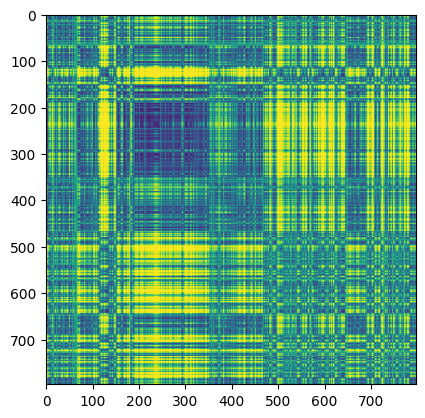

torch.Size([797, 797])
(862, 862)


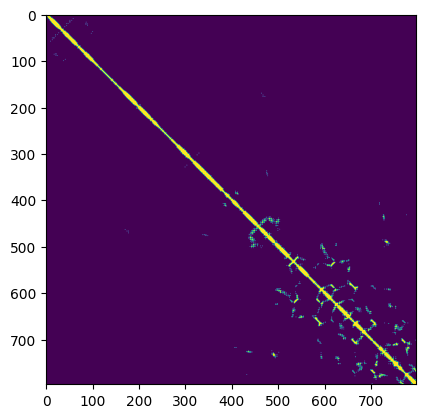

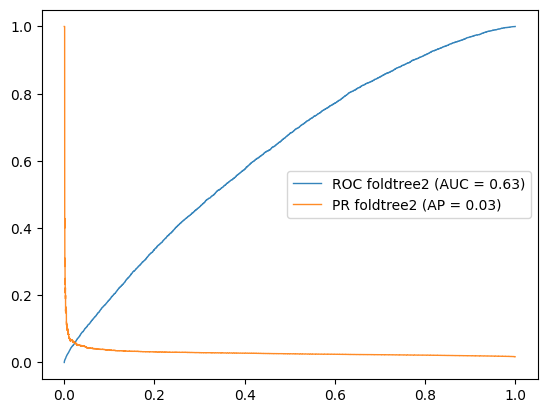

A0A6N7ZWJ4


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

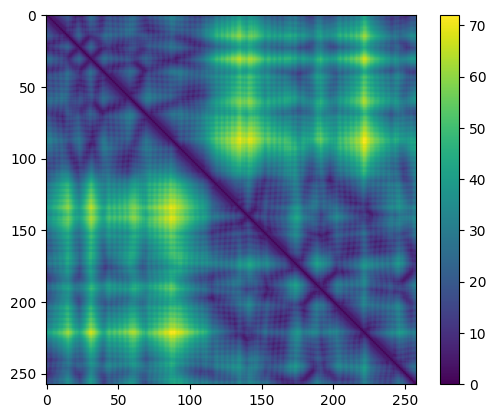

246
torch.Size([246, 20])
HeteroData(
  res={
    x=[246, 20],
    batch=[246],
  },
  positions={ x=[246, 256] },
  godnode={ x=[1, 5] },
  godnode4decoder={ x=[1, 5] },
  (res, backbone, res)={ edge_index=[2, 245] },
  (res, backbone_rev, res)={ edge_index=[2, 245] },
  (godnode4decoder, informs, res)={ edge_index=[2, 246] },
  (res, informs, godnode4decoder)={ edge_index=[2, 246] },
  (res, informs, godnode)={ edge_index=[2, 246] }
)
torch.Size([60516])
tensor([[-1.1902e+01, -1.5188e+01, -1.2810e+01,  ..., -5.7756e+00,
         -8.1759e+00, -8.1272e+00],
        [-1.1020e+01, -1.4599e+01, -1.3055e+01,  ..., -6.3308e+00,
         -9.2200e+00, -7.1893e+00],
        [-1.0293e+01, -6.6731e+00, -1.0092e+01,  ..., -1.4912e+01,
         -1.6004e+01, -8.7315e+00],
        ...,
        [-1.2243e+01, -7.2429e+00, -6.9607e+00,  ..., -1.0969e+01,
         -1.3105e+01, -5.7877e-02],
        [-1.1194e+01, -1.1045e-02, -5.6473e+00,  ..., -1.4343e+01,
         -1.3802e+01, -1.1506e+01],
        [-1

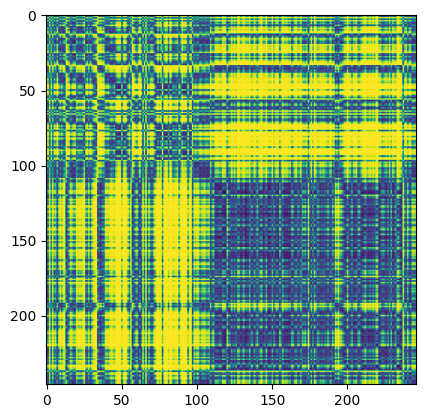

torch.Size([246, 246])
(258, 258)


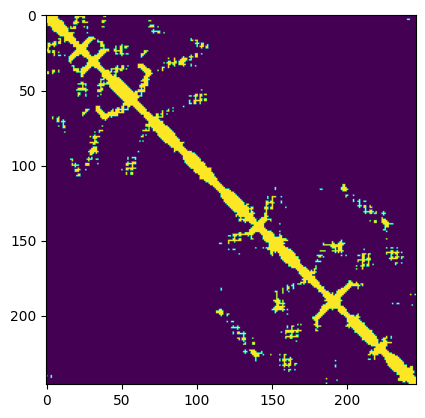

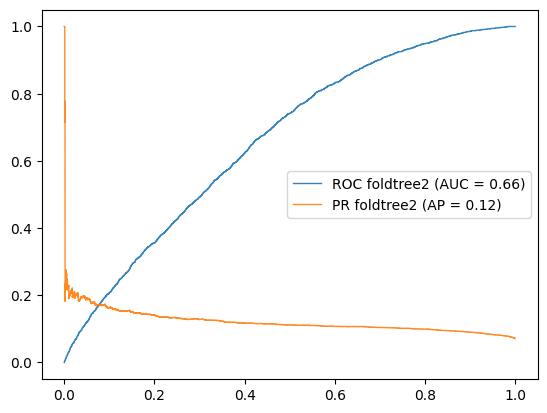

A0A3E2NWY2


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

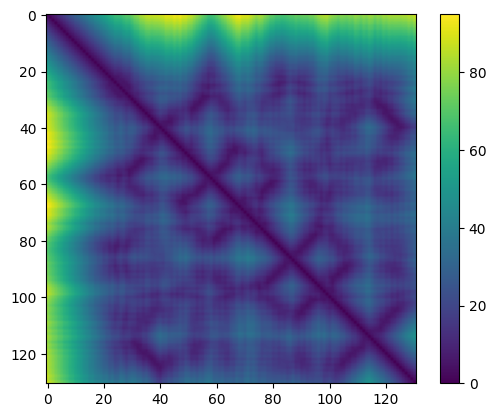

124
torch.Size([124, 20])
HeteroData(
  res={
    x=[124, 20],
    batch=[124],
  },
  positions={ x=[124, 256] },
  godnode={ x=[1, 5] },
  godnode4decoder={ x=[1, 5] },
  (res, backbone, res)={ edge_index=[2, 123] },
  (res, backbone_rev, res)={ edge_index=[2, 123] },
  (godnode4decoder, informs, res)={ edge_index=[2, 124] },
  (res, informs, godnode4decoder)={ edge_index=[2, 124] },
  (res, informs, godnode)={ edge_index=[2, 124] }
)
torch.Size([15376])
tensor([[-1.1959e+01, -1.4182e+01, -1.1811e+01,  ..., -3.9414e+00,
         -6.9834e+00, -8.0823e+00],
        [-1.1710e+01, -1.4457e+01, -1.3267e+01,  ..., -6.1407e+00,
         -8.7922e+00, -7.3392e+00],
        [-1.1866e+01, -8.2914e+00, -1.2305e+01,  ..., -1.0642e+01,
         -1.4150e+01, -8.1215e+00],
        ...,
        [-1.1194e+01, -1.2871e-02, -5.9989e+00,  ..., -1.4338e+01,
         -1.3163e+01, -1.1457e+01],
        [-7.8219e+00, -1.0890e+01, -6.9955e+00,  ..., -6.4210e+00,
         -8.2651e+00, -6.6566e+00],
        [-1

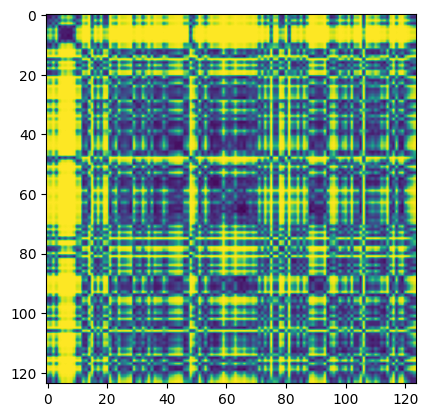

torch.Size([124, 124])
(131, 131)


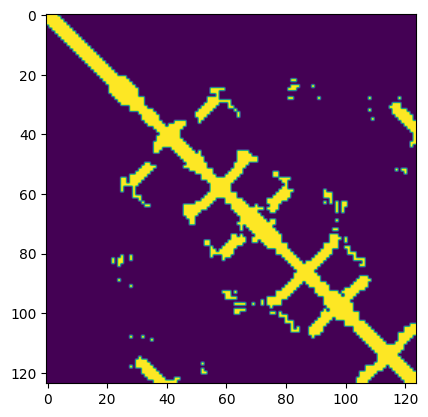

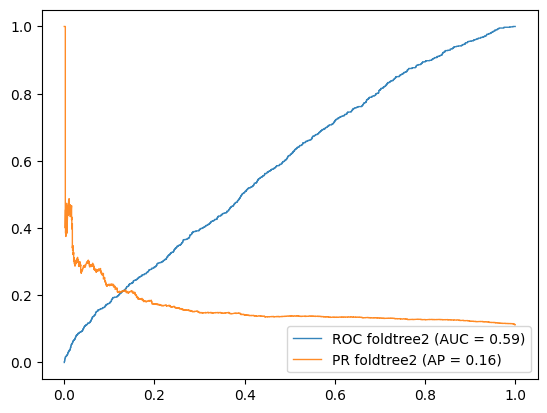

A0A0B5I870


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

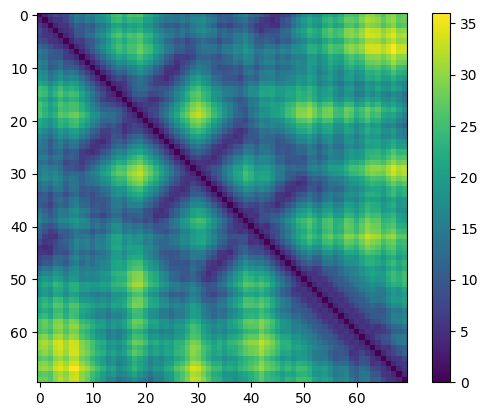

70
torch.Size([70, 20])
HeteroData(
  res={
    x=[70, 20],
    batch=[70],
  },
  positions={ x=[70, 256] },
  godnode={ x=[1, 5] },
  godnode4decoder={ x=[1, 5] },
  (res, backbone, res)={ edge_index=[2, 69] },
  (res, backbone_rev, res)={ edge_index=[2, 69] },
  (godnode4decoder, informs, res)={ edge_index=[2, 70] },
  (res, informs, godnode4decoder)={ edge_index=[2, 70] },
  (res, informs, godnode)={ edge_index=[2, 70] }
)
torch.Size([4900])
tensor([[-1.1768e+01, -1.5057e+01, -1.2973e+01,  ..., -5.5184e+00,
         -8.2526e+00, -8.3264e+00],
        [-1.2114e+01, -1.5042e+01, -1.2869e+01,  ..., -5.4317e+00,
         -8.1203e+00, -8.1456e+00],
        [-5.9444e-03, -9.7719e+00, -1.0604e+01,  ..., -8.7538e+00,
         -8.2190e+00, -1.3381e+01],
        ...,
        [-1.2245e+01, -8.7717e+00, -9.4136e+00,  ..., -7.7711e+00,
         -6.7485e+00, -9.0462e+00],
        [-8.7694e+00, -1.1026e+01, -1.1307e+01,  ..., -4.6693e+00,
         -7.2021e+00, -1.2219e+01],
        [-1.4537e+01, 

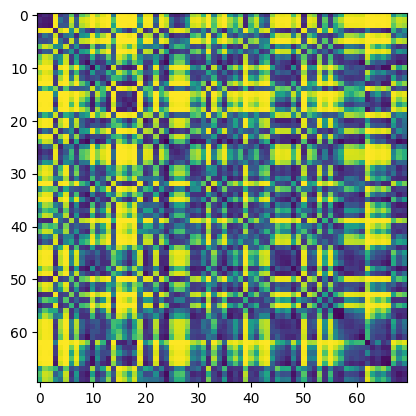

torch.Size([70, 70])
(70, 70)


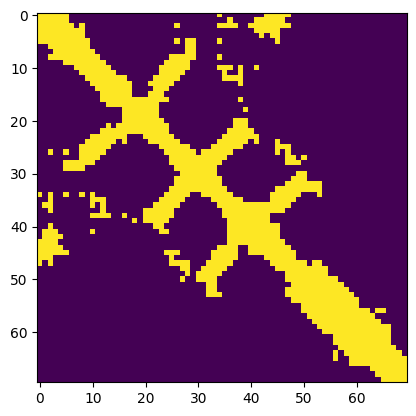

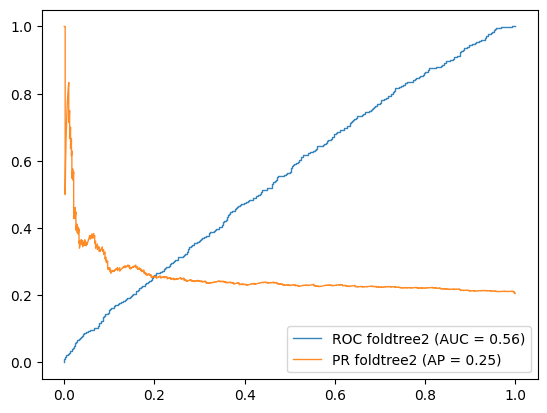

A0A4P6JT05


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

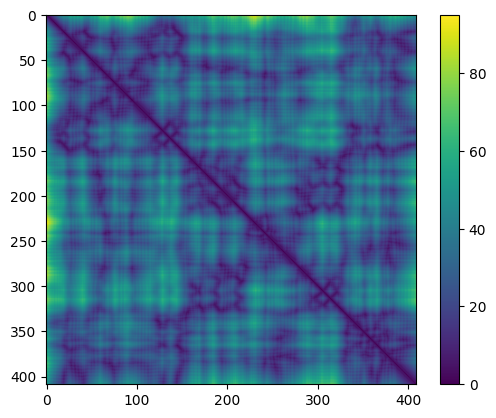

390
torch.Size([390, 20])
HeteroData(
  res={
    x=[390, 20],
    batch=[390],
  },
  positions={ x=[390, 256] },
  godnode={ x=[1, 5] },
  godnode4decoder={ x=[1, 5] },
  (res, backbone, res)={ edge_index=[2, 389] },
  (res, backbone_rev, res)={ edge_index=[2, 389] },
  (godnode4decoder, informs, res)={ edge_index=[2, 390] },
  (res, informs, godnode4decoder)={ edge_index=[2, 390] },
  (res, informs, godnode)={ edge_index=[2, 390] }
)
torch.Size([152100])
tensor([[-1.1593e+01, -1.5210e+01, -1.3018e+01,  ..., -5.9917e+00,
         -8.6365e+00, -8.0284e+00],
        [-9.7534e+00, -1.4852e+01, -1.2716e+01,  ..., -4.4756e+00,
         -8.7426e+00, -8.1104e+00],
        [-8.6286e+00, -7.2924e+00, -7.2818e+00,  ..., -1.4984e+01,
         -1.5937e+01, -5.9656e+00],
        ...,
        [-1.5703e-02, -8.2362e+00, -8.0444e+00,  ..., -8.4491e+00,
         -8.7235e+00, -1.1167e+01],
        [-9.6858e+00, -1.7438e+01, -1.3176e+01,  ..., -9.8986e+00,
         -1.3272e+01, -8.8337e+00],
        [-

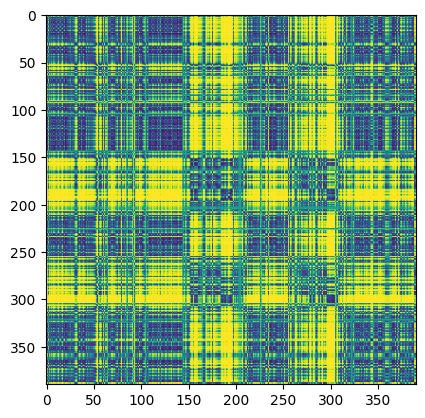

torch.Size([390, 390])
(409, 409)


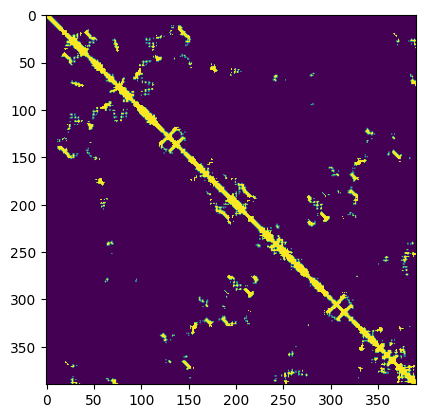

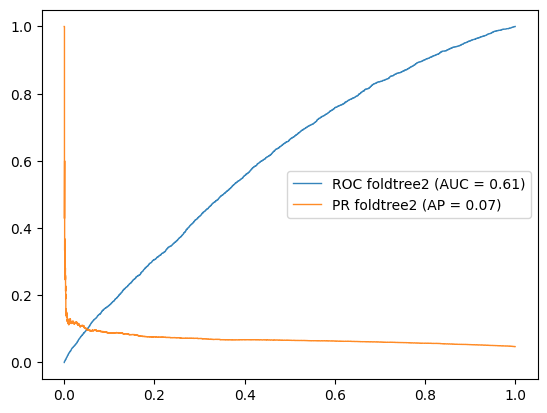

M2UF93


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

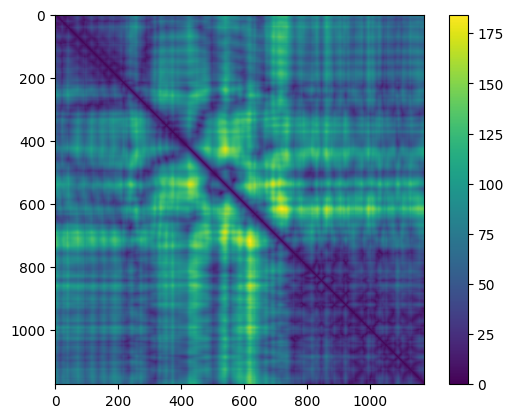

1101
torch.Size([1101, 20])
HeteroData(
  res={
    x=[1101, 20],
    batch=[1101],
  },
  positions={ x=[1101, 256] },
  godnode={ x=[1, 5] },
  godnode4decoder={ x=[1, 5] },
  (res, backbone, res)={ edge_index=[2, 1100] },
  (res, backbone_rev, res)={ edge_index=[2, 1100] },
  (godnode4decoder, informs, res)={ edge_index=[2, 1101] },
  (res, informs, godnode4decoder)={ edge_index=[2, 1101] },
  (res, informs, godnode)={ edge_index=[2, 1101] }
)
torch.Size([1212201])
tensor([[-1.1401e+01, -1.5058e+01, -1.2714e+01,  ..., -5.9429e+00,
         -8.4021e+00, -7.7700e+00],
        [-1.0836e+01, -1.3829e+01, -1.1514e+01,  ..., -3.1709e+00,
         -6.5991e+00, -8.1479e+00],
        [-9.0147e+00, -7.9471e+00, -4.5576e+00,  ..., -9.9147e+00,
         -8.1378e+00, -1.0527e+01],
        ...,
        [-1.4221e+01, -9.8207e+00, -8.6918e+00,  ..., -1.2870e+01,
         -1.5358e+01, -4.8394e-03],
        [-1.0155e+01, -7.0624e+00, -1.0582e+01,  ..., -1.0769e+01,
         -1.3976e+01, -4.9637e+00],

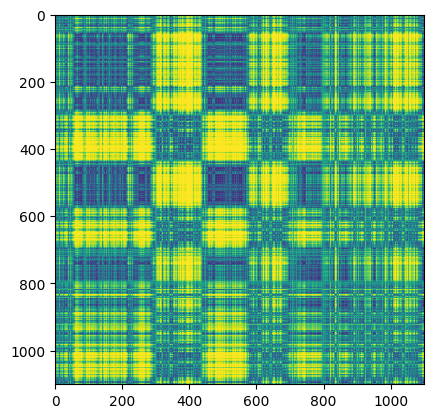

torch.Size([1101, 1101])
(1172, 1172)


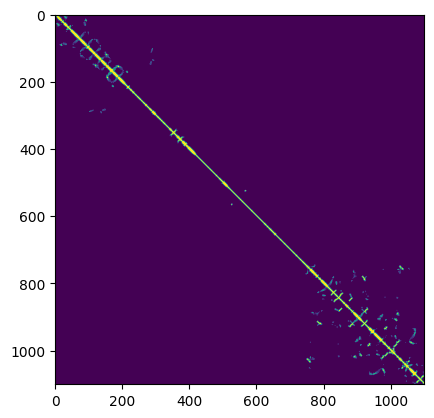

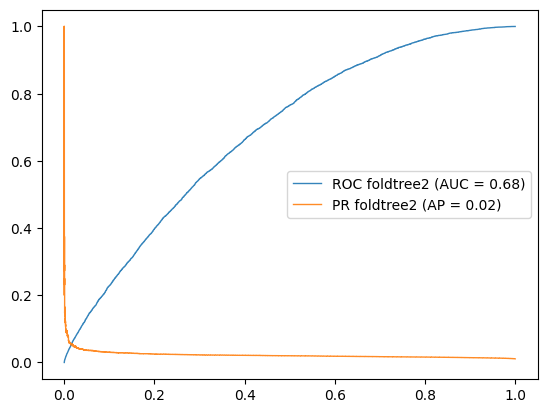

A0A7X6UZY5


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

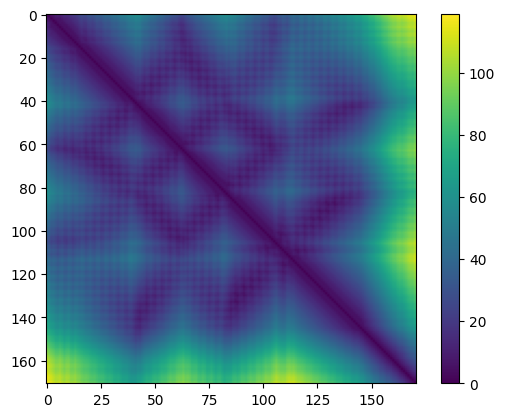

164
torch.Size([164, 20])
HeteroData(
  res={
    x=[164, 20],
    batch=[164],
  },
  positions={ x=[164, 256] },
  godnode={ x=[1, 5] },
  godnode4decoder={ x=[1, 5] },
  (res, backbone, res)={ edge_index=[2, 163] },
  (res, backbone_rev, res)={ edge_index=[2, 163] },
  (godnode4decoder, informs, res)={ edge_index=[2, 164] },
  (res, informs, godnode4decoder)={ edge_index=[2, 164] },
  (res, informs, godnode)={ edge_index=[2, 164] }
)
torch.Size([26896])
tensor([[-11.3868, -14.9101, -13.2277,  ...,  -5.7212,  -8.8674,  -8.0424],
        [ -9.5981, -13.5704, -12.9215,  ...,  -4.9138,  -9.3654,  -6.9960],
        [-10.3695,  -7.4568, -11.6559,  ...,  -9.2293, -12.9482,  -8.0582],
        ...,
        [-11.1988,  -4.1305,  -0.0324,  ..., -13.0782,  -9.4737,  -8.7215],
        [-10.9222, -13.0474, -13.1268,  ..., -14.1901, -17.6287,  -7.3740],
        [-10.5520, -11.4968,  -8.0486,  ...,  -9.4556,  -9.1820,  -9.4287]],
       device='cuda:0', grad_fn=<LogSoftmaxBackward0>)
tensor([[9.265

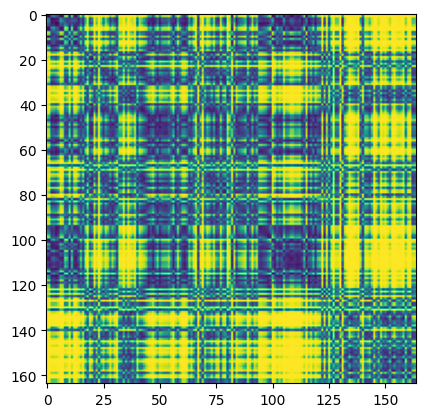

torch.Size([164, 164])
(171, 171)


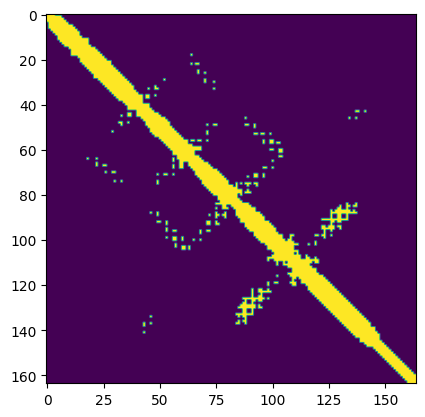

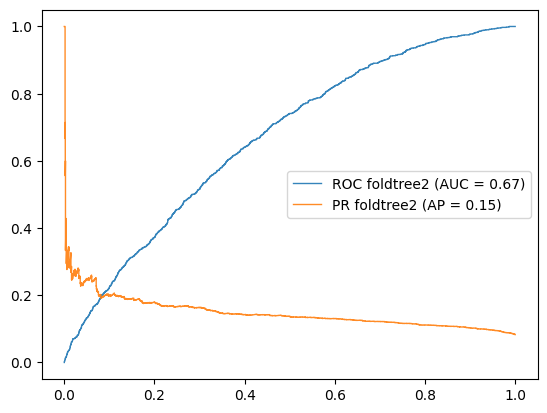

A0A1D1Z659


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

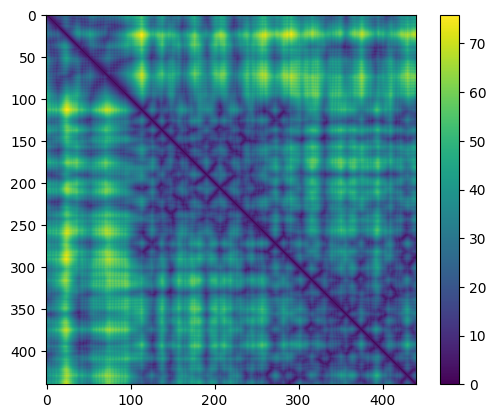

422
torch.Size([422, 20])
HeteroData(
  res={
    x=[422, 20],
    batch=[422],
  },
  positions={ x=[422, 256] },
  godnode={ x=[1, 5] },
  godnode4decoder={ x=[1, 5] },
  (res, backbone, res)={ edge_index=[2, 421] },
  (res, backbone_rev, res)={ edge_index=[2, 421] },
  (godnode4decoder, informs, res)={ edge_index=[2, 422] },
  (res, informs, godnode4decoder)={ edge_index=[2, 422] },
  (res, informs, godnode)={ edge_index=[2, 422] }
)
torch.Size([178084])
tensor([[-1.1864e+01, -1.5125e+01, -1.3026e+01,  ..., -5.7155e+00,
         -8.3425e+00, -8.2882e+00],
        [-1.0711e+01, -1.3620e+01, -1.3179e+01,  ..., -6.0060e+00,
         -9.3278e+00, -6.6173e+00],
        [-1.1534e+01, -8.2415e+00, -1.2267e+01,  ..., -1.0637e+01,
         -1.4281e+01, -7.7771e+00],
        ...,
        [-1.6635e-02, -8.7149e+00, -9.3727e+00,  ..., -7.4943e+00,
         -6.9928e+00, -1.3020e+01],
        [-5.6824e+00, -1.2200e+01, -1.0072e+01,  ..., -5.3990e+00,
         -7.5464e+00, -1.2216e+01],
        [-

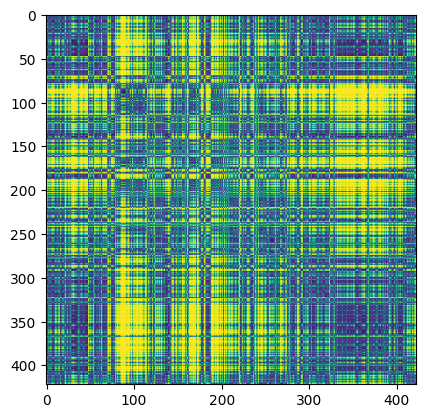

torch.Size([422, 422])
(440, 440)


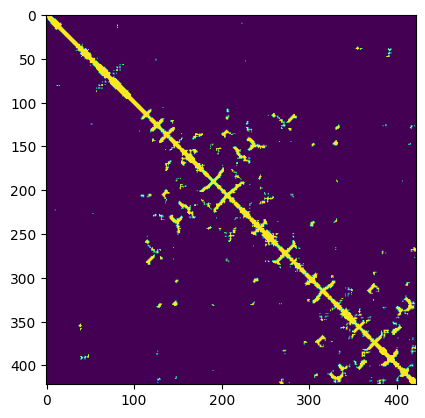

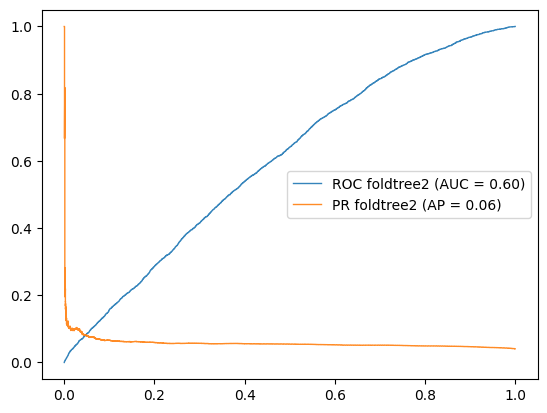

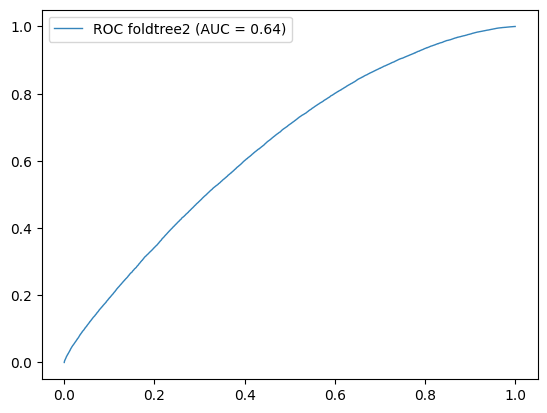

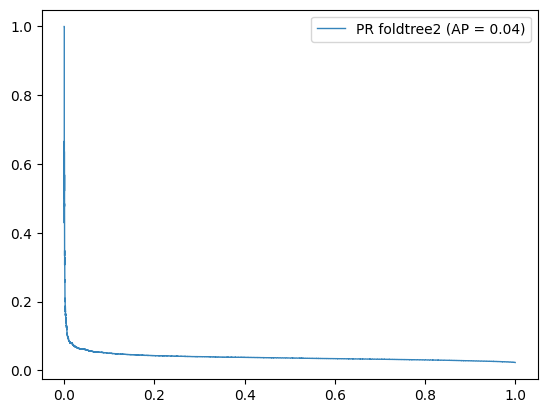

In [13]:
from Bio import PDB
from Bio.PDB import PDBParser
from sklearn.metrics import roc_curve, auc , precision_recall_curve, average_precision_score
from scipy import sparse
import torch_geometric
import losses

def get_alpha_carbon_distance_matrix(pdb_file):
	"""
	Extracts the alpha carbon (Cα) atoms from a PDB structure
	and computes the distance matrix in numpy format.

	Parameters:
	pdb_file (str): Path to the PDB file.

	Returns:
	numpy.ndarray: A matrix of distances between all Cα atoms.
	"""
	# Initialize the PDB parser
	parser = PDBParser(QUIET=True)
	
	# Parse the structure
	structure = parser.get_structure('structure', pdb_file)
	
	# Extract alpha carbon (Cα) atoms
	ca_atoms = []
	for model in structure:
		for chain in model:
			for residue in chain :
				if 'CA' in residue and PDB.is_aa(residue) :
					ca_atoms.append(residue['CA'])
	
	# Get the number of Cα atoms
	num_atoms = len(ca_atoms)
	
	# Initialize the distance matrix
	dist_matrix = np.zeros((num_atoms, num_atoms))
	
	# Compute the distances between all pairs of Cα atoms
	for i, atom_i in enumerate(ca_atoms):
		for j, atom_j in enumerate(ca_atoms):
			if i < j:
				dist_matrix[i, j] = atom_i - atom_j
	dist_matrix += dist_matrix.T
	return dist_matrix

#get aa and contacts
def get_backbone(naa):
	backbone_mat = np.zeros((naa, naa))
	backbone_rev_mat = np.zeros((naa, naa))
	np.fill_diagonal(backbone_mat[1:], 1)
	np.fill_diagonal(backbone_rev_mat[:, 1:], 1)
	return backbone_mat, backbone_rev_mat

def sparse2pairs(sparsemat):
	sparsemat = sparse.find(sparsemat)
	return np.vstack([sparsemat[0],sparsemat[1]])

def decoder_reconstruction2aa( ords , device, verbose = False):
	decoder.eval()
	z = encoder.vector_quantizer.embeddings( ords  ).to('cpu')
	print( z.shape)
	edge_index = torch.tensor( [ [i,j] for i in range(z.shape[0]) for j in range(z.shape[0]) ]  , dtype = torch.long).T
	godnode_index = np.vstack([np.zeros(z.shape[0]), [ i for i in range(z.shape[0]) ] ])
	godnode_rev = np.vstack([ [ i for i in range(z.shape[0]) ] , np.zeros(z.shape[0]) ])
	#generate a backbone for the decoder
	data = HeteroData()
	data['res'].x = z
	backbone, backbone_rev = get_backbone( z.shape[0] )
	backbone = sparse.csr_matrix(backbone)
	backbone_rev = sparse.csr_matrix(backbone_rev)
	backbone = sparse2pairs(backbone)
	backbone_rev = sparse2pairs(backbone_rev)
	positional_encoding = converter.get_positional_encoding( z.shape[0] , 256 )
	data['res'].batch = torch.tensor([0 for i in range(z.shape[0])], dtype=torch.long)
	data['positions'].x = torch.tensor( positional_encoding, dtype=torch.float32)
	data['res','backbone','res'].edge_index = torch.tensor(backbone,  dtype=torch.long )
	data[ 'res' , 'backbone_rev' , 'res'].edge_index = torch.tensor(backbone_rev, dtype=torch.long)
	#add the godnode
	data['godnode'].x = torch.tensor(np.ones((1,5)), dtype=torch.float32)
	data['godnode4decoder'].x = torch.tensor(np.ones((1,5)), dtype=torch.float32)
	data['godnode4decoder', 'informs', 'res'].edge_index = torch.tensor(godnode_index, dtype=torch.long)
	data['res', 'informs', 'godnode4decoder'].edge_index = torch.tensor(godnode_rev, dtype=torch.long)
	data['res', 'informs', 'godnode'].edge_index = torch.tensor(godnode_rev, dtype=torch.long)
	edge_index = edge_index.to( device )
	print( data )
	data = data.to( device )
	allpairs = torch.tensor( [ [i,j] for i in range(z.shape[0]) for j in range(z.shape[0]) ]  , dtype = torch.long).T
	recon_x , edge_probs , zgodnode , foldxout= decoder( data , allpairs ) 

	print( edge_probs.shape)
	amino_map = decoder.amino_acid_indices
	revmap_aa = { v:k for k,v in amino_map.items() }
	edge_probs = edge_probs.reshape((z.shape[0], z.shape[0]))
	if verbose == True:
		print( recon_x )
		print( edge_probs )
	aastr = ''.join(revmap_aa[int(idx.item())] for idx in recon_x.argmax(dim=1) )
	return aastr ,edge_probs

postives = []
predictions = []
for ex in range( encoded_df.shape[0] ):
	os.makedirs('tmp', exist_ok=True)
	example = encoded_df.iloc[ex]
	protid = encoded_df.index[ex]
	ords = example['ord']
	print( str(protid))
	AFDB_tools.grab_struct(str(protid) , structfolder='tmp/')
	#show struct
	view_custom_pdb('tmp/' + protid + '.pdb', chain='A')
	#get alpha carbon distmat with biopython
	s = get_alpha_carbon_distance_matrix( 'tmp/' + protid + '.pdb')
	#threshold the distance matrix
	plt.imshow(s)
	plt.colorbar()
	plt.show()
	#these are the embedding indices. shift by 1 to get the hex indices
	ords = torch.tensor([ c-1 if c not in rev_replace_dict_ord else rev_replace_dict_ord[c]-1 for c in ords] , dtype=torch.long)
	print( len(ords))
	ords = ords.to(device)	
	aa, edgeprobs = decoder_reconstruction2aa( ords , device = device, verbose = True)
	print(aa)
	#change range of image to 0-1
	probs = 1-edgeprobs.detach().cpu()
	probs = (probs + probs.T)/2
	plt.imshow(probs) 
	plt.show()
	print( probs.shape)
	print( s.shape)
	#output ROC curve for contact prediction

	pos = np.zeros( s.shape )
	pos[ s < 10] = 1
	pos = pos[ 0:probs.shape[0], 0:probs.shape[1]]
	plt.imshow(pos)
	plt.show()

	postives.append(pos.flatten())
	predictions.append(probs.flatten())

	#flatten the matrices
	pos = pos.flatten()
	probs = probs.flatten()
	fpr, tpr, thresholds = roc_curve(pos, 1-probs)
	roc_auc = auc(fpr, tpr)
	plt.plot(fpr, tpr, lw=1, alpha=0.9, label='ROC foldtree2 (AUC = %0.2f)' % (roc_auc))

	#output precision recall curve
	precision, recall, thresholds = precision_recall_curve(pos, 1-probs)
	average_precision = average_precision_score(pos, 1-probs)
	plt.plot(recall, precision, lw=1, alpha=0.9, label='PR foldtree2 (AP = %0.2f)' % (average_precision))
	plt.legend()
	plt.show()

#output ROC curve for contact prediction
postives = np.concatenate(postives)
predictions = np.concatenate(predictions)
fpr, tpr, thresholds = roc_curve(postives, 1-predictions)
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, lw=1, alpha=0.9, label='ROC foldtree2 (AUC = %0.2f)' % (roc_auc))
plt.legend()
plt.show()

#output precision recall curve
precision, recall, thresholds = precision_recall_curve(postives, 1-predictions)
average_precision = average_precision_score(postives, 1-predictions)
plt.plot(recall, precision, lw=1, alpha=0.9, label='PR foldtree2 (AP = %0.2f)' % (average_precision))
plt.legend()
plt.show()


In [14]:
# Function to compute Root Mean Square Deviation (RMSD)
def compute_rmsd(coords1, coords2):
    """
    Compute the Root Mean Square Deviation (RMSD) between two sets of coordinates.
    
    Parameters:
    - coords1: Nx3 NumPy array of true coordinates
    - coords2: Nx3 NumPy array of predicted coordinates
    
    Returns:
    - RMSD value
    """
    assert coords1.shape == coords2.shape, "Coordinate arrays must have the same shape"
    
    diff = coords1 - coords2
    rmsd = np.sqrt(np.mean(np.sum(diff**2, axis=1)))
    return rmsd

# Function to compute Local Distance Difference Test (lDDT)
def compute_lddt(true_coords, pred_coords, cutoff=15.0):
    """
    Compute the Local Distance Difference Test (lDDT) score.
    
    Parameters:
    - true_coords: Nx3 NumPy array of true coordinates
    - pred_coords: Nx3 NumPy array of predicted coordinates
    - cutoff: Distance threshold for considering a pair of residues
    
    Returns:
    - lDDT score (0 to 1)
    """
    assert true_coords.shape == pred_coords.shape, "Coordinate arrays must have the same shape"

    num_residues = true_coords.shape[0]
    num_pairs = 0
    num_matching_pairs = 0

    for i in range(num_residues):
        for j in range(i + 1, num_residues):
            true_dist = np.linalg.norm(true_coords[i] - true_coords[j])
            pred_dist = np.linalg.norm(pred_coords[i] - pred_coords[j])

            if true_dist < cutoff:
                num_pairs += 1
                if abs(true_dist - pred_dist) < 0.5 * true_dist:
                    num_matching_pairs += 1

    lddt_score = num_matching_pairs / num_pairs if num_pairs > 0 else 0
    return lddt_score

# Compute RMSD and lDDT
rmsd_value = compute_rmsd(true_coords_from_rt, pred_coords_from_rt)
lddt_value = compute_lddt(true_coords_from_rt, pred_coords_from_rt)

rmsd_value, lddt_value


NameError: name 'true_coords_from_rt' is not defined

In [ ]:

#plot the true and predicted structures
def transform_rt_to_coordinates(rotations, translations):
    """
    Given a list of rotation matrices (R) and translation vectors (t),
    generate the global 3D coordinates of the protein backbone.
    
    Parameters:
    - rotations: List of 3x3 rotation matrices
    - translations: List of 3x1 translation vectors
    
    Returns:
    - coords: Nx3 NumPy array representing the backbone in 3D space
    """
    num_residues = len(rotations)
    assert num_residues == len(translations), "Rotation and translation lists must be the same length"
    
    # Initialize the first coordinate at the origin
    coords = [np.array([0, 0, 0, 1])]  # Homogeneous coordinates

    # Apply transformations iteratively
    current_transform = np.eye(4)  # Identity matrix as starting point

    for R, t in zip(rotations, translations):
        # Construct the transformation matrix (4x4)
        T = np.eye(4)
        T[:3, :3] = R
        T[:3, 3] = t
        
        # Update the cumulative transformation
        current_transform = current_transform @ T
        
        # Transform the point and store the new coordinates
        new_point = current_transform @ np.array([0, 0, 0, 1])  # Homogeneous coordinates
        coords.append(new_point)

    return np.array(coords)[:, :3]  # Convert back to 3D coordinates (drop the homogeneous coordinate)


def plot_protein_structures_with_thicker_lines(true_coords, pred_coords):
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')

    # Plot true structure with thicker lines and transparency
    ax.plot(true_coords[:, 0], true_coords[:, 1], true_coords[:, 2], 
            'bo-', alpha=0.5, label='True Structure', linewidth=3, markersize=6)

    # Plot predicted structure with thicker lines and transparency
    ax.plot(pred_coords[:, 0], pred_coords[:, 1], pred_coords[:, 2], 
            'ro-', alpha=0.5, label='Predicted Structure', linewidth=3, markersize=6)

    # Adjusted arrow size
    arrow_size = 0.15  # Keep small arrows

    # Add arrowheads to indicate backbone direction
    for i in range(len(true_coords) - 1):
        ax.quiver(true_coords[i, 0], true_coords[i, 1], true_coords[i, 2],
                  true_coords[i+1, 0] - true_coords[i, 0], 
                  true_coords[i+1, 1] - true_coords[i, 1], 
                  true_coords[i+1, 2] - true_coords[i, 2],
                  color='blue', alpha=0.5, arrow_length_ratio=arrow_size)

    for i in range(len(pred_coords) - 1):
        ax.quiver(pred_coords[i, 0], pred_coords[i, 1], pred_coords[i, 2],
                  pred_coords[i+1, 0] - pred_coords[i, 0], 
                  pred_coords[i+1, 1] - pred_coords[i, 1], 
                  pred_coords[i+1, 2] - pred_coords[i, 2],
                  color='red', alpha=0.5, arrow_length_ratio=arrow_size)

    # Labels and legend
    ax.set_xlabel('X-axis')
    ax.set_ylabel('Y-axis')
    ax.set_zlabel('Z-axis')
    ax.set_title('True vs Predicted Protein Backbone Structure with Thicker Lines')
    ax.legend()

    plt.show()

# Plot with thicker lines
plot_protein_structures_with_thicker_lines(true_coords, noisy_pred_coords)


NameError: name 'true_coords' is not defined